<h1 align=center><font size = 10>Battle of Neighborhoods
    </font></h1>

## PROBLEM DESCRIPTION & BACKGROUND

Toronto and New York are very diverse and the financial capitals of their respective countries. Those famous places are diverse in multicultural as well as the financial hubs of their respective countries. Want to explore how much they are similar or dissimilar in aspects from a tourist point of view regarding food, accommodation, beautiful places, and many more.

Today Tourism is one of the pillars of the economy. People most often visits those famous places who are rich in heritage and developed enough from a foreign prospective, like friendly environment. Every city is unique in their own way and give something new. And now the information is so common regarding location of every place around the world on your fingertips which make it easier to explore. Therefore, tourists always eager to travel to different places on the basis of available information, and the comparison (the part of the information) between the two cities always assist to choose the specific places or according to their choice.

## DATA DESCRIPTION

For this problem, we will get the services of Foursquare API to explore the data of two cities, in terms of their neighborhoods. The data also include the information about the places around each neighborhood like restaurants, hotels, coffee shops, parks, theaters, art galleries, museums and many more. We selected one Borough from each city to analyze their neighborhoods. Manhattan from New York and Downtown Toronto from Toronto. We will use machine learning technique, “Clustering” to segment the neighborhoods with similar objects on the basis of each neighborhood data. These objects will be given priority on the basis of foot traffic (activity) in their respective neighborhoods. This will help to locate the tourist’s areas and hubs, and then we can judge the similarity or dissimilarity between two cities on that basis.

## METHODOLOGY

As we have selected two cities Borough to explore their neighborhoods. The data exploration, analysis and visualization for both boroughs are done in the same way but separately.

## Preprocessing

### Setup : Download all the dependencies

In [110]:
!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
!conda install -c anaconda beautifulsoup4 --yes
!conda install -c anaconda html5lib --yes
!conda install -c anaconda lxml --yes
!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab


import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
import json # library to handle JSON files
import requests # library to handle requests
import matplotlib.cm as cm # Matplotlib and associated plotting modules
import matplotlib.colors as colors # Matplotlib and associated plotting modules
import folium # map rendering library
import requests # library to handle requests
import folium # map rendering library
import urllib.request

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
from sklearn.cluster import KMeans # import k-means from clustering stage
from sklearn.cluster import KMeans # import k-means from clustering stage
from bs4 import BeautifulSoup

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - beautifulsoup4


The following packages will be SUPERSEDED by a higher-priority channel:

  ca-certificates    conda-forge::ca-certificates-2020.4.5~ --> anaconda::ca-certificates-2020.1.1-0
  certifi            conda-forge::certifi-2020.4.5.1-py36h~ --> anaconda::certifi-2020.4.5.1-py36_0
  openssl            conda-forge::openssl-1.1.1g-h516909a_0 --> anaconda::openssl-1.1.1g-h7b6447c_0


Preparing transaction: done
Verifying transaction: done
Executing transaction: done
Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - folium=0.5.0


The following pa

### Download and Explore dataset

In [113]:
source = urllib.request.urlopen('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M').read()
soup = BeautifulSoup(source,'lxml')

table = soup.find_all('table')
df = pd.read_html(str(table))[0]

df.head(5)

,Postal Code,Borough,Neighborhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


In [112]:
df.shape

(180, 3)

### Ignore cells with a borough that is Not assigned.

In [115]:
Toronto_df = df[df['Borough'] != 'Not assigned']
Toronto_df.shape

(103, 3)

### Combined neighborhoods into one row separated with a comma group by postal code &  Borough

In [116]:
Toronto_DataSet = pd.pivot_table(Toronto_df, index=['Postal Code','Borough'], 
                        values=['Neighborhood'], 
                        aggfunc=lambda x: ', '.join(map(str, x)))

In [117]:
Toronto_DataSet.reset_index(inplace=True)
Toronto_DataSet.head(5)

,Postal Code,Borough,Neighborhood
0,M1B,Scarborough,"Malvern, Rouge"
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae


### Assign neighborhood = borough if a cell has a borough but a Not assigned neighborhood 

In [118]:
Filter = (Toronto_DataSet['Neighborhood'] == 'Not assigned') & (Toronto_DataSet['Borough'].notnull())
Toronto_DataSet.loc[Filter, 'Neighborhood'] = Toronto_DataSet.loc[Filter, 'Borough']

In [119]:
Toronto_DataSet.shape

(103, 3)

### Load geographical coordinates of each postal code into a dataframe

In [120]:
import pandas as pd
Geospatial_Dataset = pd.read_csv('Geospatial_data.csv')
Geospatial_Dataset.head(5)

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


### Combine neighborhood + geographical coordinates dataset

In [121]:
Toronto_With_Geospatial_Data =Toronto_DataSet.merge(Geospatial_Dataset, left_on='Postal Code', right_on='Postal Code')
Toronto_With_Geospatial_Data.head(5)

,Postal Code,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,"Malvern, Rouge",43.806686,-79.194353
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711
3,M1G,Scarborough,Woburn,43.770992,-79.216917
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476


In [122]:
Toronto_With_Geospatial_Data['Borough'].value_counts()

North York          24
Downtown Toronto    19
Scarborough         17
Etobicoke           12
Central Toronto      9
West Toronto         6
York                 5
East York            5
East Toronto         5
Mississauga          1
Name: Borough, dtype: int64

In [123]:
Toronto_With_Geospatial_Data.shape

(103, 5)

In [124]:
Toronto_With_Geospatial_Data['Borough'].unique()

array(['Scarborough', 'North York', 'East York', 'East Toronto',
       'Central Toronto', 'Downtown Toronto', 'York', 'West Toronto',
       'Mississauga', 'Etobicoke'], dtype=object)

### Extract Toronto data alone

In [130]:
Toronto_With_Geospatial_Data = Toronto_With_Geospatial_Data[Toronto_With_Geospatial_Data['Borough'].str.contains('Toronto')]
Toronto_With_Geospatial_Data.shape

(39, 5)

###  Get top  venues that are in Tornoto within a radius of 500 meters.

### Foursquare Credentials and Version

In [131]:
CLIENT_ID = 'TAXMYNQKZY2DQNNYXGLAQLCFFAFK5JV135EBEYE03AJHITX5' # your Foursquare ID
CLIENT_SECRET = 'O5ZJMIQRTLO0E3HUPT355CKGTOCRMZAQWDYZN0BMU2IPQV4I' # your Foursquare Secret
VERSION = '20180604'
LIMIT = 30
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)


Your credentails:
CLIENT_ID: TAXMYNQKZY2DQNNYXGLAQLCFFAFK5JV135EBEYE03AJHITX5
CLIENT_SECRET:O5ZJMIQRTLO0E3HUPT355CKGTOCRMZAQWDYZN0BMU2IPQV4I


### Function to get Nearby Venues

In [133]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
       
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

        nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
        nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)



### Get Nearby Venues for all Neighborhood in Tornoto

In [134]:
tornoto_venues = getNearbyVenues(names=Toronto_With_Geospatial_Data['Neighborhood'],
                                   latitudes=Toronto_With_Geospatial_Data['Latitude'],
                                   longitudes=Toronto_With_Geospatial_Data['Longitude']
                                  )

The Beaches
The Danforth West, Riverdale
India Bazaar, The Beaches West
Studio District
Lawrence Park
Davisville North
North Toronto West, Lawrence Park
Davisville
Moore Park, Summerhill East
Summerhill West, Rathnelly, South Hill, Forest Hill SE, Deer Park
Rosedale
St. James Town, Cabbagetown
Church and Wellesley
Regent Park, Harbourfront
Garden District, Ryerson
St. James Town
Berczy Park
Central Bay Street
Richmond, Adelaide, King
Harbourfront East, Union Station, Toronto Islands
Toronto Dominion Centre, Design Exchange
Commerce Court, Victoria Hotel
Roselawn
Forest Hill North & West, Forest Hill Road Park
The Annex, North Midtown, Yorkville
University of Toronto, Harbord
Kensington Market, Chinatown, Grange Park
CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport
Stn A PO Boxes
First Canadian Place, Underground city
Christie
Dufferin, Dovercourt Village
Little Portugal, Trinity
Brockton, Parkdale Village, Exhibition Place
High 

In [137]:
tornoto_venues.shape

(864, 7)

### Get Top 20 venues based on frequency

In [138]:
tornoto_top10_venues = tornoto_venues.groupby('Venue Category').count()
tornoto_top10_venues = tornoto_top10_venues.sort_values(by=['Neighborhood'],ascending=False).head(20)
tornoto_top10_venues.reset_index(inplace = True)

In [139]:
tornoto_top10_venues

,Venue Category,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude
0,Coffee Shop,63,63,63,63,63,63
1,Café,62,62,62,62,62,62
2,Restaurant,28,28,28,28,28,28
3,Park,28,28,28,28,28,28
4,Bakery,21,21,21,21,21,21
5,Italian Restaurant,21,21,21,21,21,21
6,Pizza Place,17,17,17,17,17,17
7,Sandwich Place,15,15,15,15,15,15
8,Japanese Restaurant,15,15,15,15,15,15
9,Bar,15,15,15,15,15,15


### Display Venue Categories

In [141]:
tornoto_venues['Venue Category'].nunique()

191

In [31]:
tornoto_venues['Venue Category'].unique()

array(['Trail', 'Health Food Store', 'Pub', 'Neighborhood',
       'Cosmetics Shop', 'Greek Restaurant', 'Italian Restaurant',
       'Ice Cream Shop', 'Yoga Studio', 'Brewery',
       'Fruit & Vegetable Store', 'Dessert Shop', 'Restaurant',
       'Pizza Place', 'Juice Bar', 'Bookstore', 'Bubble Tea Shop',
       'Furniture / Home Store', 'Grocery Store', 'Spa', 'Coffee Shop',
       'Bakery', 'Caribbean Restaurant', 'Gym', 'Fish & Chips Shop',
       'Fast Food Restaurant', 'Sushi Restaurant', 'Park', 'Liquor Store',
       'Pet Store', 'Steakhouse', 'Burrito Place', 'Movie Theater',
       'Sandwich Place', 'Food & Drink Shop', 'Fish Market', 'Gay Bar',
       'Seafood Restaurant', 'American Restaurant', 'Cheese Shop', 'Café',
       'Middle Eastern Restaurant', 'Comfort Food Restaurant',
       'Stationery Store', 'Wine Bar', 'Thai Restaurant',
       'Coworking Space', 'Latin American Restaurant', 'Swim School',
       'Bus Line', 'Breakfast Spot', 'Department Store', 'Hotel',
   

### Check how many venues were returned for each neighborhood

In [142]:
tornoto_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Berczy Park,30,30,30,30,30,30
"Brockton, Parkdale Village, Exhibition Place",23,23,23,23,23,23
"Business reply mail Processing Centre, South Central Letter Processing Plant Toronto",16,16,16,16,16,16
"CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport",17,17,17,17,17,17
Central Bay Street,30,30,30,30,30,30
Christie,16,16,16,16,16,16
Church and Wellesley,30,30,30,30,30,30
"Commerce Court, Victoria Hotel",30,30,30,30,30,30
Davisville,30,30,30,30,30,30


### Find out how many unique categories can be curated from all the returned venues

In [33]:
print('There are {} uniques categories.'.format(len(tornoto_venues['Venue Category'].unique())))

There are 191 uniques categories.


In [143]:
tornoto_venues.shape

(864, 7)

### Data Preprocessing - one hot encoding - Venue Category

In [144]:
tornoto_onehot = pd.get_dummies(tornoto_venues[['Venue Category']], prefix="", prefix_sep="")
tornoto_onehot.index.values


array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [145]:
# Using DataFrame.insert() to add a column 
tornoto_onehot.insert(0, "Tornoto_Neighborhood", tornoto_venues["Neighborhood"], True) 
tornoto_onehot.head(5)

,Tornoto_Neighborhood,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Basketball Stadium,Beer Bar,Beer Store,Belgian Restaurant,Bistro,Boat or Ferry,Bookstore,Boutique,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Burrito Place,Bus Line,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Gym,College Rec Center,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Distribution Center,Dog Run,Donut Shop,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Health Food Store,Historic Site,History Museum,Hobby Shop,Home Service,Hotel,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Intersection,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Movie Theater,Museum,Music Venue,Neighborhood,New American Restaurant,Nightclub,Office,Opera House,Organic Grocery,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Pool,Pub,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Restaurant,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Sculpture Garden,Seafood Restaurant,Shoe Repair,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Supermarket,Sushi Restaurant,Swim School,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Wine Bar,Wings Joint,Yoga Studio
0,The Beaches,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,The Beaches,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,The Beaches,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,The Beaches,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [146]:
tornoto_onehot.shape

(864, 192)

### Group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [147]:
tornoto_grouped = tornoto_onehot.groupby('Tornoto_Neighborhood').mean().reset_index()
tornoto_grouped.head(5)

,Tornoto_Neighborhood,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Basketball Stadium,Beer Bar,Beer Store,Belgian Restaurant,Bistro,Boat or Ferry,Bookstore,Boutique,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Burrito Place,Bus Line,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Gym,College Rec Center,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Distribution Center,Dog Run,Donut Shop,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Health Food Store,Historic Site,History Museum,Hobby Shop,Home Service,Hotel,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Intersection,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Movie Theater,Museum,Music Venue,Neighborhood,New American Restaurant,Nightclub,Office,Opera House,Organic Grocery,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Pool,Pub,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Restaurant,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Sculpture Garden,Seafood Restaurant,Shoe Repair,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Supermarket,Sushi Restaurant,Swim School,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Wine Bar,Wings Joint,Yoga Studio
0,Berczy Park,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.033333,0.000000,0.0,0.0,0.0000,0.0,0.0,0.0,0.033333,0.0,0.000000,0.033333,0.066667,0.0,0.0,0.033333,0.000000,0.0,0.000000,0.033333,0.0000,0.000000,0.0,0.000000,0.0,0.0,0.033333,0.0,0.0,0.0,0.033333,0.000000,0.0,0.000000,0.0,0.066667,0.066667,0.0,0.0,0.0,0.0,0.033333,0.000000,0.033333,0.000000,0.0,0.0,0.033333,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.033333,0.0000,0.0,0.033333,0.0,0.0,0.0,0.0,0.033333,0.033333,0.0,0.0,0.000000,0.0,0.0000,0.0000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.033333,0.0,0.0,0.0,0.0,0.0,0.0000,0.033333,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.033333,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.033333,0.000000,0.000000,0.0,0.0000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0000,0.000000,0.033333,0.0,0.0,0.0,0.000000,0.000000,0.066667,0.0,0.0,0.0000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.033333,0.0,0.0,0.0,0.033333,0.0,0.0,0.0,0.0,0.0,0.033333,0.0,0.0,0.0,0.0,0.000000
1,"Brockton, Parkdale Village, Exhibition Place",0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0000,0.0,0.0,0.0,0.043478,0.0,0.

In [148]:
tornoto_grouped.shape

(39, 192)

### Function to get Top n Venues

In [149]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [150]:
num_top_venues = 20

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = tornoto_grouped['Tornoto_Neighborhood']

for ind in np.arange(tornoto_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(tornoto_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
0,Berczy Park,Beer Bar,Seafood Restaurant,Cocktail Bar,Coffee Shop,Restaurant,Farmers Market,Bistro,Fish Market,Basketball Stadium,Breakfast Spot,Jazz Club,Bakery,Fountain,Tailor Shop,French Restaurant,Liquor Store,Thai Restaurant,Art Gallery,Café,Park
1,"Brockton, Parkdale Village, Exhibition Place",Café,Coffee Shop,Breakfast Spot,Grocery Store,Bakery,Convenience Store,Performing Arts Venue,Pet Store,Climbing Gym,Restaurant,Burrito Place,Office,Italian Restaurant,Intersection,Stadium,Bar,Nightclub,Furniture / Home Store,Gym,Flower Shop
2,"Business reply mail Processing Centre, South C...",Yoga Studio,Brewery,Gym / Fitness Center,Garden Center,Garden,Fast Food Restaurant,Farmers Market,Light Rail Station,Comic Shop,Park,Recording Studio,Restaurant,Burrito Place,Skate Park,Pizza Place,Auto Workshop,Bagel Shop,Dog Run,Falafel Restaurant,Event Space
3,"CN Tower, King and Spadina, Railway Lands, Har...",Airport Service,Airport Lounge,Airport Terminal,Airport,Bar,Harbor / Marina,Coffee Shop,Rental Car Location,Sculpture Garden,Boutique,Boat or Ferry,Plane,Airport Food Court,Auto Workshop,Discount Store,Falafel Restaurant,Event Space,Ethiopian Restaurant,Electronics Store,Eastern European Restaurant
4,Central Bay Street,Coffee Shop,Café,Bar,Seafood Restaurant,Bubble Tea Shop,Sandwich Place,Ramen Restaurant,Poke Place,Chinese Restaurant,Park,Comic Shop,Modern European Restaurant,Middle Eastern Restaurant,Dessert Shop,Japanese Restaurant,Italian Restaurant,Hotel,Spa,Yoga Studio,Gastropub


## Visualition


## create map of Toronto using latitude and longitude values

In [153]:
#Fetch latitude and longitude for Tornoto
from geopy.geocoders import Nominatim
address = 'Toronto, CA'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 43.6534817, -79.3839347.


In [154]:
# create map of Toronto using latitude and longitude values
map_Toronto = folium.Map(location=[latitude,longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(Toronto_With_Geospatial_Data['Latitude'], Toronto_With_Geospatial_Data['Longitude'], Toronto_With_Geospatial_Data['Borough'], Toronto_With_Geospatial_Data['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Toronto)  
    
map_Toronto



## Top 20 Venues Categories

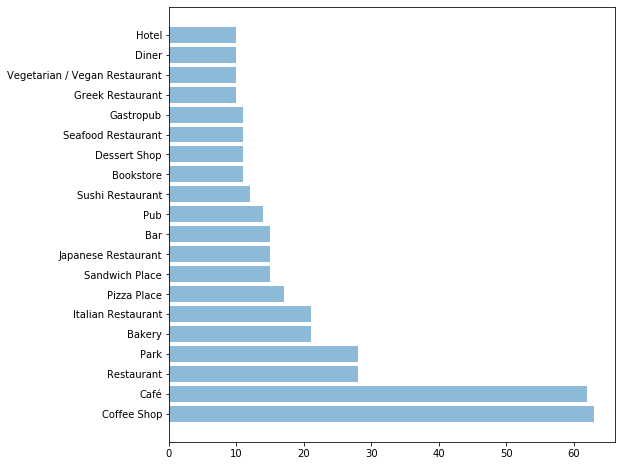

In [157]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.barh(tornoto_top10_venues['Venue Category'], tornoto_top10_venues['Neighborhood'],alpha=0.5)
plt.show()


## Cluster Neighborhoods using K-means

In [158]:
# set number of clusters
kclusters = 5

tornoto_grouped_clustering = tornoto_grouped.drop('Tornoto_Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(tornoto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [159]:
tornoto_grouped_clustering.shape

(39, 191)

### Add Clustering Labels

In [160]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_, True)
tornoto_merged = Toronto_With_Geospatial_Data

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
tornoto_merged = tornoto_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

tornoto_merged.head() # check the last columns!
tornoto_merged.groupby('Borough').count()

,Postal Code,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
Borough,,,,,,,,,,,,,,,,,,,,,,,,,
Central Toronto,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9
Downtown Toronto,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19
East Toronto,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
West Toronto,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6


In [161]:
tornoto_merged['Cluster Labels'].value_counts()

0    34
1     2
4     1
3     1
2     1
Name: Cluster Labels, dtype: int64

### Examine Clusters

### Cluster 1 - Venue Category

In [162]:
Cluster1_1st_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['1st Most Common Venue'].unique())
Cluster1_2nd_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['2nd Most Common Venue'].unique())
Cluster1_3rd_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['3rd Most Common Venue'].unique())
Cluster1_4th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['4th Most Common Venue'].unique())
Cluster1_5th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['5th Most Common Venue'].unique())
Cluster1_6th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['6th Most Common Venue'].unique())
Cluster1_7th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['7th Most Common Venue'].unique())
Cluster1_8th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['8th Most Common Venue'].unique())
Cluster1_9th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['9th Most Common Venue'].unique())
Cluster1_10th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['10th Most Common Venue'].unique())
Cluster1_11th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['11th Most Common Venue'].unique())
Cluster1_12th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['12th Most Common Venue'].unique())
Cluster1_13th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['13th Most Common Venue'].unique())
Cluster1_14th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['14th Most Common Venue'].unique())
Cluster1_15th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['15th Most Common Venue'].unique())
Cluster1_16th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['16th Most Common Venue'].unique())
Cluster1_17th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['17th Most Common Venue'].unique())
Cluster1_18th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['18th Most Common Venue'].unique())
Cluster1_19th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['19th Most Common Venue'].unique())
Cluster1_20th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 0]['20th Most Common Venue'].unique())
Common_venues = (Cluster1_1st_venue,Cluster1_2nd_venue,Cluster1_3rd_venue,Cluster1_4th_venue,Cluster1_5th_venue,Cluster1_6th_venue,Cluster1_7th_venue,Cluster1_8th_venue,Cluster1_9th_venue,Cluster1_10th_venue,Cluster1_11th_venue,Cluster1_12th_venue,Cluster1_13th_venue,Cluster1_14th_venue,Cluster1_15th_venue,Cluster1_16th_venue,Cluster1_17th_venue,Cluster1_18th_venue,Cluster1_19th_venue,Cluster1_20th_venue )
df_common = pd.DataFrame(Common_venues)
df_common

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
0,Airport Service,Asian Restaurant,Bakery,Beer Bar,Burger Joint,Café,Clothing Store,Coffee Shop,Dessert Shop,Gastropub,Gift Shop,Greek Restaurant,Grocery Store,Jewelry Store,Park,Pizza Place,Pub,Restaurant,Sandwich Place,Yoga Studio,None,None,None,None,None,None,None,None,None,None,None,None
1,Airport Lounge,Bar,Bookstore,Breakfast Spot,Brewery,Café,Coffee Shop,Fast Food Restaurant,Gastropub,Italian Restaurant,Mexican Restaurant,Park,Pharmacy,Plaza,Seafood Restaurant,Sushi Restaurant,Theater,Trail,Vietnamese Restaurant,None,None,None,None,None,None,None,None,None,None,None,None,None
2,Airport Terminal,Bakery,Bank,Bar,Bookstore,Breakfast Spot,Café,Cocktail Bar,Coffee Shop,Creperie,Deli / Bodega,Gastropub,Grocery Store,Gym / Fitness Center,Hotel,Ice Cream Shop,Men's Store,Mexican Restaurant,Park,Pet Store,Pizza Place,Restaurant,Sandwich Place,Seafood Restaurant,Sushi Restaurant,Yoga Studio,None,None,None,None,None,None
3,Airport,Baby Store,Bakery,Beer Bar,Breakfast Spot,Burrito Place,Café,Cocktail Bar,Coffee Shop,Dessert Shop,Diner,Furniture / Home Store,Garden Center,Grocery Store,Gym / Fitness Center,Hotel,Italian Restaurant,Japanese Restaurant,Mexican Restaurant,Performing Arts Venue,Pharmacy,Pub,Restaurant,Sandwich Place,Seafood Restaurant,Sushi Restaurant,Thai Restaurant,Theater,Yoga Studio,None,None,None
4,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beer Bar,Brewery,Bubble Tea Shop,Café,Cocktail Bar,Coffee Shop,Eastern European Restaurant,Fast Food Restaurant,Food & Drink Shop,Fruit & Vegetable Store,Garden,Gastropub,Grocery Store,Italian Restaurant,Japanese Restaurant,Latin American Restaurant,Middle Eastern Restaurant,Pub,Restaurant,Salad Place,Salon / Barbershop,Tea Room,Yoga Studio,None,None,None,None
5,Bakery,Brewery,Burger Joint,Convenience Store,Deli / Bodega,Diner,Dog Run,Farmers Market,Fast Food Restaurant,General Travel,Harbor / Marina,Hotel,IT Services,Italian Restaurant,Jazz Club,Liquor Store,Music Venue,New American Restaurant,Pub,Record Shop,Restaurant,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Smoke Shop,Smoothie Shop,Sports Bar,Sushi Restaurant,Yoga Studio,None,None,None
6,Bakery,Bar,Bistro,Breakfast Spot,Brewery,Café,Candy Store,Chocolate Shop,Coffee Shop,Creperie,Diner,Ethiopian Restaurant,Farmers Market,Fish Market,Fried Chicken Joint,Gym,IT Services,Ice Cream Shop,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Liquor Store,Museum,Music Venue,Park,Performing Arts Venue,Pizza Place,Ramen Restaurant,Rental Car Location,Seafood Restaurant,Tailor Shop,None
7,Bank,Belgian Restaurant,Bookstore,Burger Joint,Chinese Restaurant,Concert Hall,Department Store,Distribution Center,Electronics Store,Fish Market,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Light Rail Station,Middle Eastern Restaurant,Neighborhood,Pet Store,Pizza Place,Poke Place,Pool,Rental Car Location,Restaurant,Skating Rink,None,None,None,None,None,None,None
8,Bar,Basketball Stadium,Bookstore,Butcher,Café,Cajun / Creole Restaurant,Chinese Restaurant,Climbing Gym,Comic Shop,Deli / Bodega,Dessert Shop,Diner,Eastern European Restaurant,Event Space,Farmers Market,Furniture / Home Store,Italian Restaurant,Japanese Restaurant,Neighborhood,New American Restaurant,Nightclub,Park,Pub,Ramen Restaurant,Restaurant,Sandwich Place,Sculpture Garden,Seafood Restaurant,Supermarket,None,None,None
9,Boutique,Breakfast Spot,Brewery,Burger Joint,Café,Caribbean Restaurant,Coffee Shop,Dessert Shop,Distribution Center,Donut Shop,Electronics Store,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Ice Cream Shop,Italian Restaurant,Lounge,Mexican Restaurant,Movie Theater,Park,Pizza Place,Pub,Record Shop,Restaurant,Shoe Repair,Sushi Restaurant,None,None,None,None,None,None


## Cluster1 ( Airport Services, Restaurant, Art Gallery, Bakery, Bar, Bookstore, cafe)

In [163]:
tornoto_merged.loc[tornoto_merged['Cluster Labels'] == 0, tornoto_merged.columns[[1] + list(range(5, tornoto_merged.shape[1]))]]

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
41,East Toronto,0,Greek Restaurant,Italian Restaurant,Ice Cream Shop,Yoga Studio,Fruit & Vegetable Store,Pub,Pizza Place,Juice Bar,Furniture / Home Store,Dessert Shop,Spa,Cosmetics Shop,Coffee Shop,Caribbean Restaurant,Bubble Tea Shop,Brewery,Bookstore,Bakery,Restaurant,Grocery Store
42,East Toronto,0,Park,Fast Food Restaurant,Pet Store,Pub,Brewery,Sandwich Place,Liquor Store,Restaurant,Italian Restaurant,Ice Cream Shop,Steakhouse,Fish & Chips Shop,Sushi Restaurant,Burrito Place,Food & Drink Shop,Movie Theater,Gym,Pizza Place,Cosmetics Shop,Comic Shop
43,East Toronto,0,Café,Coffee Shop,Bakery,Yoga Studio,Latin American Restaurant,Seafood Restaurant,Brewery,Neighborhood,Bookstore,Italian Restaurant,Ice Cream Shop,Cheese Shop,Stationery Store,Fish Market,Sandwich Place,American Restaurant,Wine Bar,Comfort Food Restaurant,Middle Eastern Restaurant,Thai Restaurant
45,Central Toronto,0,Pizza Place,Park,Gym / Fitness Center,Sandwich Place,Food & Drink Shop,Hotel,Breakfast Spot,Department Store,Diner,Electronics Store,Eastern European Restaurant,Donut Shop,Dog Run,Distribution Center,Discount Store,Deli / Bodega,Dessert Shop,Dance Studio,Cuban Restaurant,Creperie
46,Central Toronto,0,Clothing Store,Coffee Shop,Yoga Studio,Gym / Fitness Center,Salon / Barbershop,Restaurant,Rental Car Location,Pet Store,Park,Mexican Restaurant,Fast Food Restaurant,Gift Shop,Sporting Goods Shop,Diner,Cosmetics Shop,Chinese Restaurant,Café,Bagel Shop,Spa,Grocery Store
47,Central Toronto,0,Dessert Shop,Sushi Restaurant,Sandwich Place,Café,Coffee Shop,Italian Restaurant,Gym,Pizza Place,Seafood Restaurant,Brewery,Restaurant,Diner,Farmers Market,Indian Restaurant,Gas Station,Greek Restaurant,Park,Pharmacy,Thai Restaurant,Gourmet Shop
49,Central Toronto,0,Pub,Coffee Shop,Bank,Sushi Restaurant,Bagel Shop,Sports Bar,Fried Chicken Joint,Restaurant,Supermarket,Pizza Place,American Restaurant,Liquor Store,Light Rail Station,Vietnamese Restaurant,Discount Store,Diner,Dessert Shop,Dog Run,Distribution Center,Yoga Studio
51,Downtown Toronto,0,Bakery,Italian Restaurant,Coffee Shop,Café,Restaurant,Liquor Store,Indian Restaurant,Jewelry Store,Butcher,Caribbean Restaurant,Pet Store,Beer Store,Diner,Market,Playground,Deli / Bodega,Gastropub,Park,Pub,Japanese Restaurant
52,Downtown Toronto,0,Burger Joint,Coffee Shop,Creperie,Breakfast Spot,Bubble Tea Shop,Salon / Barbershop,Café,Restaurant,Ramen Restaurant,Pub,Pizza Place,Park,Mexican Restaurant,Bookstore,Men's Store,Martial Arts Dojo,Dance Studio,Diner,Juice Bar,Japanese Restaurant
53,Downtown Toronto,0,Coffee Shop,Park,Breakfast Spot,Theater,Bakery,Yoga Studio,Chocolate Shop,Distribution Center,Event Space,Café,Farmers Market,Spa,Restaurant,Dessert Shop,Ice Cream Shop,Pub,French Restaurant,Historic Site,Gym / Fitness Center,Performing Arts Venue


### Cluster 2 - Venue Category

In [164]:
Cluster1_1st_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['1st Most Common Venue'].unique())
Cluster1_2nd_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['2nd Most Common Venue'].unique())
Cluster1_3rd_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['3rd Most Common Venue'].unique())
Cluster1_4th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['4th Most Common Venue'].unique())
Cluster1_5th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['5th Most Common Venue'].unique())
Cluster1_6th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['6th Most Common Venue'].unique())
Cluster1_7th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['7th Most Common Venue'].unique())
Cluster1_8th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['8th Most Common Venue'].unique())
Cluster1_9th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['9th Most Common Venue'].unique())
Cluster1_10th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['10th Most Common Venue'].unique())
Cluster1_11th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['11th Most Common Venue'].unique())
Cluster1_12th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['12th Most Common Venue'].unique())
Cluster1_13th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['13th Most Common Venue'].unique())
Cluster1_14th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['14th Most Common Venue'].unique())
Cluster1_15th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['15th Most Common Venue'].unique())
Cluster1_16th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['16th Most Common Venue'].unique())
Cluster1_17th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['17th Most Common Venue'].unique())
Cluster1_18th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['18th Most Common Venue'].unique())
Cluster1_19th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['19th Most Common Venue'].unique())
Cluster1_20th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 1]['20th Most Common Venue'].unique())
Common_venues = (Cluster1_1st_venue,Cluster1_2nd_venue,Cluster1_3rd_venue,Cluster1_4th_venue,Cluster1_5th_venue,Cluster1_6th_venue,Cluster1_7th_venue,Cluster1_8th_venue,Cluster1_9th_venue,Cluster1_10th_venue,Cluster1_11th_venue,Cluster1_12th_venue,Cluster1_13th_venue,Cluster1_14th_venue,Cluster1_15th_venue,Cluster1_16th_venue,Cluster1_17th_venue,Cluster1_18th_venue,Cluster1_19th_venue,Cluster1_20th_venue )
df_common = pd.DataFrame(Common_venues)
df_common

,0,1
0,Park,Restaurant
1,Park,Playground
2,Trail,None
3,Department Store,Yoga Studio
4,Department Store,Ethiopian Restaurant
5,Electronics Store,Ethiopian Restaurant
6,Eastern European Restaurant,Electronics Store
7,Donut Shop,Eastern European Restaurant
8,Dog Run,Donut Shop
9,Distribution Center,Dog Run


## Cluster 2 (Park, Department Store, Electronics Store, Discount Store, Dessert Shop , Dance Studio)

In [165]:
tornoto_merged.loc[tornoto_merged['Cluster Labels'] == 1, tornoto_merged.columns[[1] + list(range(5, tornoto_merged.shape[1]))]]

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
48,Central Toronto,1,Restaurant,Park,Trail,Department Store,Ethiopian Restaurant,Electronics Store,Eastern European Restaurant,Donut Shop,Dog Run,Distribution Center,Discount Store,Diner,Dessert Shop,Yoga Studio,Deli / Bodega,Falafel Restaurant,Dance Studio,Cuban Restaurant,Creperie,Coworking Space
50,Downtown Toronto,1,Park,Playground,Trail,Yoga Studio,Department Store,Ethiopian Restaurant,Electronics Store,Eastern European Restaurant,Donut Shop,Dog Run,Distribution Center,Discount Store,Diner,Dessert Shop,Dance Studio,Deli / Bodega,Falafel Restaurant,Cuban Restaurant,Creperie,Coworking Space


### Cluster 3 - Venue Category

In [166]:
Cluster1_1st_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['1st Most Common Venue'].unique())
Cluster1_2nd_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['2nd Most Common Venue'].unique())
Cluster1_3rd_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['3rd Most Common Venue'].unique())
Cluster1_4th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['4th Most Common Venue'].unique())
Cluster1_5th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['5th Most Common Venue'].unique())
Cluster1_6th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['6th Most Common Venue'].unique())
Cluster1_7th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['7th Most Common Venue'].unique())
Cluster1_8th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['8th Most Common Venue'].unique())
Cluster1_9th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['9th Most Common Venue'].unique())
Cluster1_10th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['10th Most Common Venue'].unique())
Cluster1_11th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['11th Most Common Venue'].unique())
Cluster1_12th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['12th Most Common Venue'].unique())
Cluster1_13th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['13th Most Common Venue'].unique())
Cluster1_14th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['14th Most Common Venue'].unique())
Cluster1_15th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['15th Most Common Venue'].unique())
Cluster1_16th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['16th Most Common Venue'].unique())
Cluster1_17th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['17th Most Common Venue'].unique())
Cluster1_18th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['18th Most Common Venue'].unique())
Cluster1_19th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['19th Most Common Venue'].unique())
Cluster1_20th_venue =np.sort(tornoto_merged[tornoto_merged['Cluster Labels'] == 2]['20th Most Common Venue'].unique())
Common_venues = (Cluster1_1st_venue,Cluster1_2nd_venue,Cluster1_3rd_venue,Cluster1_4th_venue,Cluster1_5th_venue,Cluster1_6th_venue,Cluster1_7th_venue,Cluster1_8th_venue,Cluster1_9th_venue,Cluster1_10th_venue,Cluster1_11th_venue,Cluster1_12th_venue,Cluster1_13th_venue,Cluster1_14th_venue,Cluster1_15th_venue,Cluster1_16th_venue,Cluster1_17th_venue,Cluster1_18th_venue,Cluster1_19th_venue,Cluster1_20th_venue )
df_common = pd.DataFrame(Common_venues)
df_common

,0
0,Neighborhood
1,Health Food Store
2,Trail
3,Pub
4,Deli / Bodega
5,Electronics Store
6,Eastern European Restaurant
7,Donut Shop
8,Dog Run
9,Distribution Center


# Cluster 3  ( Health Food Store, Trail, Pub, Deli/Bodega)

In [167]:
tornoto_merged.loc[tornoto_merged['Cluster Labels'] == 2, tornoto_merged.columns[[1] + list(range(5, tornoto_merged.shape[1]))]]

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
37,East Toronto,2,Neighborhood,Health Food Store,Trail,Pub,Deli / Bodega,Electronics Store,Eastern European Restaurant,Donut Shop,Dog Run,Distribution Center,Discount Store,Diner,Dessert Shop,Department Store,Yoga Studio,Dance Studio,Event Space,Cuban Restaurant,Creperie,Coworking Space


# Cluster 4 (Home Service, Garden, Event Space)

In [168]:
tornoto_merged.loc[tornoto_merged['Cluster Labels'] == 3, tornoto_merged.columns[[1] + list(range(5, tornoto_merged.shape[1]))]]

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
63,Central Toronto,3,Home Service,Garden,Yoga Studio,Dessert Shop,Event Space,Ethiopian Restaurant,Electronics Store,Eastern European Restaurant,Donut Shop,Dog Run,Distribution Center,Discount Store,Diner,Deli / Bodega,Department Store,Farmers Market,Dance Studio,Cuban Restaurant,Creperie,Coworking Space


# Cluster 5 (Bus line, Swim School, Coworking Space)

In [169]:
tornoto_merged.loc[tornoto_merged['Cluster Labels'] == 4, tornoto_merged.columns[[1] + list(range(5, tornoto_merged.shape[1]))]]

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
44,Central Toronto,4,Park,Bus Line,Swim School,Yoga Studio,Dessert Shop,Ethiopian Restaurant,Electronics Store,Eastern European Restaurant,Donut Shop,Dog Run,Distribution Center,Discount Store,Diner,Department Store,Falafel Restaurant,Deli / Bodega,Dance Studio,Cuban Restaurant,Creperie,Coworking Space


## Visualization

In [171]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(tornoto_merged['Latitude'], tornoto_merged['Longitude'], tornoto_merged['Neighborhood'], tornoto_merged['Cluster Labels']):
    c = int(cluster)
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[c-1],
        fill=True,
        fill_color=rainbow[c-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

---------------------------

# Analyse NewYork Neighborhood

### Download and explore the data

In [245]:
!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset
print('Data downloaded!')

Data downloaded!


In [246]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [247]:
neighborhoods_data = newyork_data['features']

Let's take a look at the first item in this list.

In [248]:
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

### Tranform the data into a *pandas* dataframe

The next task is essentially transforming this data of nested Python dictionaries into a *pandas* dataframe. So let's start by creating an empty dataframe.

In [249]:
import pandas as pd

# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

Take a look at the empty dataframe to confirm that the columns are as intended.

In [250]:
neighborhoods

,Borough,Neighborhood,Latitude,Longitude


Then let's loop through the data and fill the dataframe one row at a time.

In [251]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

Quickly examine the resulting dataframe.

In [252]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


And make sure that the dataset has all 5 boroughs and 306 neighborhoods.

In [253]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


### Get the top venues that are in New York within a radius of 500 meters.

In [254]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
        print(lat)    
        print(lng)
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            30)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)


In [255]:
neighborhoods.head(5)

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [256]:
newyork_data = getNearbyVenues(names=neighborhoods['Neighborhood'],latitudes=neighborhoods['Latitude'],longitudes=neighborhoods['Longitude'])

Wakefield
40.89470517661
-73.84720052054902
Co-op City
40.87429419303012
-73.82993910812398
Eastchester
40.887555677350775
-73.82780644716412
Fieldston
40.89543742690383
-73.90564259591682
Riverdale
40.890834493891305
-73.9125854610857
Kingsbridge
40.88168737120521
-73.90281798724604
Marble Hill
40.87655077879964
-73.91065965862981
Woodlawn
40.89827261213805
-73.86731496814176
Norwood
40.87722415599446
-73.8793907395681
Williamsbridge
40.88103887819211
-73.85744642974207
Baychester
40.866858107252696
-73.83579759808117
Pelham Parkway
40.85741349808865
-73.85475564017999
City Island
40.84724670491813
-73.78648845267413
Bedford Park
40.870185164975325
-73.8855121841913
University Heights
40.85572707719664
-73.9104159619131
Morris Heights
40.84789792606271
-73.91967159119565
Fordham
40.86099679638654
-73.89642655981623
East Tremont
40.84269615786053
-73.88735617532338
West Farms
40.83947505672653
-73.87774474910545
High  Bridge
40.836623010706056
-73.9261020935813
Melrose
40.8197543705949

KeyError: 'groups'

In [189]:
newyork_top10_venues = newyork_data.groupby('Venue Category').count()
newyork_top10_venues = newyork_top10_venues.sort_values(by=['Neighborhood'],ascending=False).head(20)
newyork_top10_venues.reset_index(inplace = True)
newyork_top10_venues

,Venue Category,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude
0,Pizza Place,311,311,311,311,311,311
1,Deli / Bodega,191,191,191,191,191,191
2,Coffee Shop,165,165,165,165,165,165
3,Italian Restaurant,160,160,160,160,160,160
4,Chinese Restaurant,152,152,152,152,152,152
5,Bakery,144,144,144,144,144,144
6,Sandwich Place,130,130,130,130,130,130
7,Donut Shop,130,130,130,130,130,130
8,Grocery Store,128,128,128,128,128,128
9,Pharmacy,127,127,127,127,127,127


In [190]:
newyork_data.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Allerton,29,29,29,29,29,29
Annadale,14,14,14,14,14,14
Arden Heights,4,4,4,4,4,4
Arlington,7,7,7,7,7,7
Arrochar,21,21,21,21,21,21
Arverne,18,18,18,18,18,18
Astoria,30,30,30,30,30,30
Astoria Heights,14,14,14,14,14,14
Auburndale,16,16,16,16,16,16


### Let's find out how many unique categories can be curated from all the returned venues

In [191]:
print('There are {} uniques categories.'.format(len(newyork_data['Venue Category'].unique())))

There are 382 uniques categories.


<a id='item3'></a>

### Preprocessing - Venue Category - one hot encoding

In [192]:
# one hot encoding
newyork_onehot = pd.get_dummies(newyork_data[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
newyork_onehot['Neighborhood'] = newyork_data['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [newyork_onehot.columns[-1]] + list(newyork_onehot.columns[:-1])
newyork_onehot = newyork_onehot[fixed_columns]

newyork_onehot.head()

,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Cafeteria,College Gym,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Field,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Mall,Outlet Store,Paella Restaurant,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Pie Shop,Pier,Piercing Parlor,Pilates Studio,Pizza Place,Platform

And let's examine the new dataframe size.

In [193]:
newyork_onehot.shape

(6145, 382)

### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [194]:
newyork_grouped = newyork_onehot.groupby('Neighborhood').mean().reset_index()
newyork_grouped

,Neighborhood,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Cafeteria,College Gym,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Field,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Mall,Outlet Store,Paella Restaurant,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Café,Pet Service,Pet Store,Pharmacy,Pie Shop,Pier,Piercing Parlor,Pilates Studio,Pizza Place,Platform

#### Let's confirm the new size

In [88]:
newyork_grouped.shape

(300, 382)

#### Let's print each neighborhood along with the top 5 most common venues

In [89]:
num_top_venues = 5

for hood in newyork_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = newyork_grouped[newyork_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Allerton----
            venue  freq
0     Pizza Place  0.17
1   Deli / Bodega  0.07
2     Supermarket  0.07
3   Grocery Store  0.07
4  Cosmetics Shop  0.03


----Annadale----
                 venue  freq
0  American Restaurant  0.21
1         Dance Studio  0.07
2                Diner  0.07
3             Pharmacy  0.07
4        Train Station  0.07


----Arden Heights----
              venue  freq
0       Pizza Place  0.25
1          Pharmacy  0.25
2            Lawyer  0.25
3       Coffee Shop  0.25
4  Pedestrian Plaza  0.00


----Arlington----
                 venue  freq
0        Boat or Ferry  0.14
1         Intersection  0.14
2        Deli / Bodega  0.14
3  American Restaurant  0.14
4             Bus Stop  0.14


----Arrochar----
                venue  freq
0       Deli / Bodega  0.10
1  Italian Restaurant  0.10
2            Bus Stop  0.10
3  Athletics & Sports  0.05
4      Cosmetics Shop  0.05


----Arverne----
            venue  freq
0       Surf Spot  0.22
1   Metro Station  

### Function to sort the venues in descending order.

In [195]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [196]:
num_top_venues = 20

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = newyork_grouped['Neighborhood']

for ind in np.arange(newyork_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(newyork_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
0,Allerton,Pizza Place,Supermarket,Grocery Store,Deli / Bodega,Breakfast Spot,Spa,Bus Station,Chinese Restaurant,Department Store,Playground,Dessert Shop,Intersection,Bakery,Pharmacy,Donut Shop,Electronics Store,Fast Food Restaurant,Fried Chicken Joint,Gas Station,Martial Arts Dojo
1,Annadale,American Restaurant,Sports Bar,Sushi Restaurant,Train Station,Pharmacy,Diner,Park,Restaurant,Pizza Place,Dance Studio,Food,Cosmetics Shop,Event Service,Falafel Restaurant,Ethiopian Restaurant,Entertainment Service,English Restaurant,Event Space,Exhibit,Factory
2,Arden Heights,Lawyer,Pharmacy,Coffee Shop,Pizza Place,Women's Store,Falafel Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farm,Electronics Store,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop
3,Arlington,Intersection,Grocery Store,Deli / Bodega,American Restaurant,Bus Stop,Boat or Ferry,Coffee Shop,Fast Food Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Filipino Restaurant,Field,Entertainment Service,Fish & Chips Shop,Fish Market
4,Arrochar,Bus Stop,Deli / Bodega,Italian Restaurant,Athletics & Sports,Liquor Store,Mediterranean Restaurant,Sandwich Place,Bagel Shop,Middle Eastern Restaurant,Pharmacy,Supermarket,Outdoors & Recreation,Cosmetics Shop,Pizza Place,Nail Salon,Polish Restaurant,Food Truck,Hotel,Factory,Ethiopian Restaurant


## Visualization

### Create map of New York using latitude and longitude values

In [198]:
from geopy.geocoders import Nominatim
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))


The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [199]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork


### Top 20 Venue categories

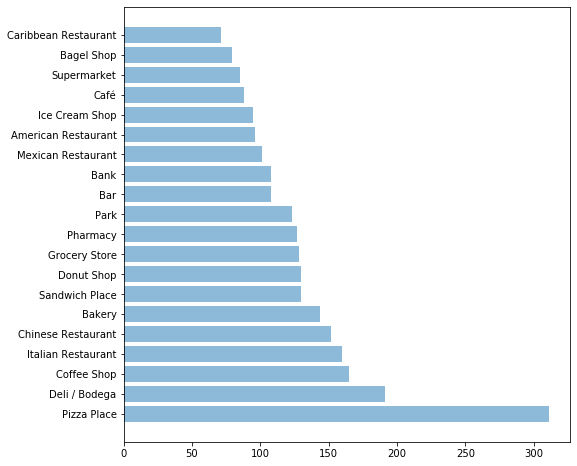

In [203]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.barh(newyork_top10_venues['Venue Category'], newyork_top10_venues['Neighborhood'],alpha=0.5)
plt.show()

## Cluster Neighborhoods using k-means

In [204]:
# set number of clusters
kclusters = 5

newyork_grouped_clustering = newyork_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(newyork_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([3, 0, 3, 2, 2, 3, 0, 3, 0, 3], dtype=int32)

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [205]:
### Add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

newyork_merged = newyork_data

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
newyork_merged = newyork_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

newyork_merged.head() # check the last columns!

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
1,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
3,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant


## Visualization

In [210]:
    # create map
    map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

    # set color scheme for the clusters
    x = np.arange(kclusters)
    ys = [i + x + (i*x)**2 for i in range(kclusters)]
    colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
    rainbow = [colors.rgb2hex(i) for i in colors_array]

    # add markers to the map
    markers_colors = []
    for lat, lon, poi, cluster in zip(newyork_merged['Venue Latitude'], newyork_merged['Venue Longitude'], newyork_merged['Neighborhood'], newyork_merged['Cluster Labels']):
        label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[cluster-1],
            fill=True,
            fill_color=rainbow[cluster-1],
            fill_opacity=0.7).add_to(map_clusters)

    map_clusters

<a id='item5'></a>

## Examine Clusters

Now, you can examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, you can then assign a name to each cluster. I will leave this exercise to you.

#### Cluster 1

Cluster 1 - Venue Category

In [212]:
Cluster1_1st_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['1st Most Common Venue'].unique())
Cluster1_2nd_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['2nd Most Common Venue'].unique())
Cluster1_3rd_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['3rd Most Common Venue'].unique())
Cluster1_4th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['4th Most Common Venue'].unique())
Cluster1_5th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['5th Most Common Venue'].unique())
Cluster1_6th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['6th Most Common Venue'].unique())
Cluster1_7th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['7th Most Common Venue'].unique())
Cluster1_8th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['8th Most Common Venue'].unique())
Cluster1_9th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['9th Most Common Venue'].unique())
Cluster1_10th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['10th Most Common Venue'].unique())
Cluster1_11th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['11th Most Common Venue'].unique())
Cluster1_12th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['12th Most Common Venue'].unique())
Cluster1_13th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['13th Most Common Venue'].unique())
Cluster1_14th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['14th Most Common Venue'].unique())
Cluster1_15th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['15th Most Common Venue'].unique())
Cluster1_16th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['16th Most Common Venue'].unique())
Cluster1_17th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['17th Most Common Venue'].unique())
Cluster1_18th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['18th Most Common Venue'].unique())
Cluster1_19th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['19th Most Common Venue'].unique())
Cluster1_20th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 0]['20th Most Common Venue'].unique())
Common_venues = (Cluster1_1st_venue,Cluster1_2nd_venue,Cluster1_3rd_venue,Cluster1_4th_venue,Cluster1_5th_venue,Cluster1_6th_venue,Cluster1_7th_venue,Cluster1_8th_venue,Cluster1_9th_venue,Cluster1_10th_venue,Cluster1_11th_venue,Cluster1_12th_venue,Cluster1_13th_venue,Cluster1_14th_venue,Cluster1_15th_venue,Cluster1_16th_venue,Cluster1_17th_venue,Cluster1_18th_venue,Cluster1_19th_venue,Cluster1_20th_venue )
df_common = pd.DataFrame(Common_venues)
df_common

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82
0,American Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Bakery,Bank,Bar,Baseball Stadium,Big Box Store,Bus Line,Bus Station,Café,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Construction & Landscaping,Convenience Store,Cosmetics Shop,Deli / Bodega,Discount Store,Flower Shop,Food Truck,Frozen Yogurt Shop,Furniture / Home Store,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Hotel,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Intersection,Italian Restaurant,Jewelry Store,Korean Restaurant,Latin American Restaurant,Lawyer,Mediterranean Restaurant,Mexican Restaurant,Moving Target,Park,Performing Arts Venue,Pizza Place,Plaza,Pool,Rental Car Location,River,Sandwich Place,Seafood Restaurant,Spa,Sports Club,Thai Restaurant,Theater,Turkish Restaurant,Vietnamese Restaurant,Wine Shop,Yoga Studio,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,American Restaurant,Arcade,Art Gallery,Bagel Shop,Bakery,Bar,Baseball Field,Beach,Beer Garden,Bubble Tea Shop,Burger Joint,Bus Station,Bus Stop,Café,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Concert Hall,Cosmetics Shop,Cupcake Shop,Deli / Bodega,Dessert Shop,Diner,Food,French Restaurant,Furniture / Home Store,Gourmet Shop,Grocery Store,Gym,Gym / Fitness Center,Hotel,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Karaoke Bar,Lounge,Memorial Site,Mexican Restaurant,Mobile Phone Shop,New American Restaurant,Park,Peruvian Restaurant,Pizza Place,Plaza,Pub,Rest Area,Sandwich Place,Scenic Lookout,Seafood Restaurant,Soup Place,Spa,Sports Bar,Storage Facility,Sushi Restaurant,Tapas Restaurant,Thai Restaurant,Thrift / Vintage Store,Wine Bar,Wine Shop,Women's Store,Yoga Studio,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,African Restaurant,American Restaurant,Art Gallery,Bagel Shop,Bakery,Bar,Boat or Ferry,Bookstore,Breakfast Spot,Burger Joint,Bus Line,Bus Station,Café,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Construction & Landscaping,Convenience Store,Cosmetics Shop,Deli / Bodega,Dessert Shop,Dog Run,Donut Shop,Event Space,Farmers Market,Food,French Restaurant,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,History Museum,Hotel,Ice Cream Shop,Italian Restaurant,Japanese Restaurant,Kids Store,Lounge,Massage Studio,Men's Store,Mexican Restaurant,Mobile Phone Shop,Motorcycle Shop,Noodle House,Park,Pizza Place,Playground,Plaza,Russian Restaurant,Sandwich Place,Scenic Lookout,South American Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Sushi Restaurant,Tennis Court,Thai Restaurant,Train Station,Wine Bar,Wine Shop,Women's Store,Yoga Studio,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
3,American Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Bistro,Boat or Ferry,Bus Station,Bus Stop,Café,Caribbean Restaurant,Chinese Restaurant,Cocktail Bar,Coffee Shop,Concert Hall,Cycle Studio,Deli / Bodega,Dessert Shop,Diner,Donut Shop,Electronics Store,English Restaurant,Farmers Market,Fast Food Restaurant,Flower Shop,Food Court,Food Truck,Golf Course,Greek Restaurant,Grocery Store,Gym,Harbor / Marina,Hotel Bar,Ice Cream Shop,Intersection,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Music Venue,Nightclub,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Restaurant,Rock Club,Sculpture Garden,Seafood Restaurant,Shoe Store,South American Restaurant,Spa,Spanish

In [213]:
cluster1 = newyork_merged.loc[newyork_merged['Cluster Labels'] == 0, newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]]
cluster1.head(10)

,Neighborhood Latitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
46,40.895437,-73.905621,Plaza,0,River,Plaza,Bus Station,Women's Store,Farmers Market,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Field,Fast Food Restaurant,Electronics Store,Filipino Restaurant,Fish & Chips Shop,Fish Market
47,40.895437,-73.908261,River,0,River,Plaza,Bus Station,Women's Store,Farmers Market,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Field,Fast Food Restaurant,Electronics Store,Filipino Restaurant,Fish & Chips Shop,Fish Market
48,40.895437,-73.908151,Bus Station,0,River,Plaza,Bus Station,Women's Store,Farmers Market,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Field,Fast Food Restaurant,Electronics Store,Filipino Restaurant,Fish & Chips Shop,Fish Market
49,40.890834,-73.910248,Plaza,0,Park,Bus Station,Plaza,Gym,Bank,Home Service,Playground,Locksmith,Filipino Restaurant,Event Space,Food,Flower Shop,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Exhibit,Fish & Chips Shop,Factory
50,40.890834,-73.908331,Park,0,Park,Bus Station,Plaza,Gym,Bank,Home Service,Playground,Locksmith,Filipino Restaurant,Event Space,Food,Flower Shop,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Exhibit,Fish & Chips Shop,Factory
51,40.890834,-73.907921,Bank,0,Park,Bus Station,Plaza,Gym,Bank,Home Service,Playground,Locksmith,Filipino Restaurant,Event Space,Food,Flower Shop,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Exhibit,Fish & Chips Shop,Factory
52,40.890834,-73.916113,Park,0,Park,Bus Station,Plaza,Gym,Bank,Home Service,Playground,Locksmith,Filipino Restaurant,Event Space,Food,Flower Shop,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Exhibit,Fish & Chips Shop,Factory
53,40.890834,-73.916050,Locksmith,0,Park,Bus Station,Plaza,Gym,Bank,Home Service,Playground,Locksmith,Filipino Restaurant,Event Space,Food,Flower Shop,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Exhibit,Fish & Chips Shop,Factory
54,40.890834,-73.913215,Home Service,0,Park,Bus Station,Plaza,Gym,Bank,Home Service,Playground,Locksmith,Filipino Restaurant,Event Space,Food,Flower Shop,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Exhibit,Fish & Chips Shop,Factory
55,40.890834,-73.917446,Gym,0,Park,Bus Station,Plaza,Gym,Bank,Home Service,Playground,Locksmith,Filipino Restaurant,Event Space,Food,Flower Shop,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Exhibit,Fish & Chips Shop,Factory


#### Cluster 2

Cluster 2 - Venue Category

In [215]:
Cluster1_1st_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['1st Most Common Venue'].unique())
Cluster1_2nd_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['2nd Most Common Venue'].unique())
Cluster1_3rd_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['3rd Most Common Venue'].unique())
Cluster1_4th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['4th Most Common Venue'].unique())
Cluster1_5th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['5th Most Common Venue'].unique())
Cluster1_6th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['6th Most Common Venue'].unique())
Cluster1_7th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['7th Most Common Venue'].unique())
Cluster1_8th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['8th Most Common Venue'].unique())
Cluster1_9th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['9th Most Common Venue'].unique())
Cluster1_10th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['10th Most Common Venue'].unique())
Cluster1_11th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['11th Most Common Venue'].unique())
Cluster1_12th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['12th Most Common Venue'].unique())
Cluster1_13th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['13th Most Common Venue'].unique())
Cluster1_14th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['14th Most Common Venue'].unique())
Cluster1_15th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['15th Most Common Venue'].unique())
Cluster1_16th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['16th Most Common Venue'].unique())
Cluster1_17th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['17th Most Common Venue'].unique())
Cluster1_18th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['18th Most Common Venue'].unique())
Cluster1_19th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['19th Most Common Venue'].unique())
Cluster1_20th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 1]['20th Most Common Venue'].unique())
Common_venues = (Cluster1_1st_venue,Cluster1_2nd_venue,Cluster1_3rd_venue,Cluster1_4th_venue,Cluster1_5th_venue,Cluster1_6th_venue,Cluster1_7th_venue,Cluster1_8th_venue,Cluster1_9th_venue,Cluster1_10th_venue,Cluster1_11th_venue,Cluster1_12th_venue,Cluster1_13th_venue,Cluster1_14th_venue,Cluster1_15th_venue,Cluster1_16th_venue,Cluster1_17th_venue,Cluster1_18th_venue,Cluster1_19th_venue,Cluster1_20th_venue )
df_common = pd.DataFrame(Common_venues)
df_common

,0
0,Deli / Bodega
1,Women's Store
2,Farmers Market
3,English Restaurant
4,Entertainment Service
5,Ethiopian Restaurant
6,Event Service
7,Event Space
8,Exhibit
9,Factory


In [217]:
newyork_merged.loc[newyork_merged['Cluster Labels'] == 1, newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]]

,Neighborhood Latitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
4310,40.660003,-73.751554,Deli / Bodega,1,Deli / Bodega,Women's Store,Farmers Market,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Fast Food Restaurant,Electronics Store,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flower Shop,Food


#### Cluster 3

In [219]:
Cluster1_1st_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['1st Most Common Venue'].unique())
Cluster1_2nd_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['2nd Most Common Venue'].unique())
Cluster1_3rd_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['3rd Most Common Venue'].unique())
Cluster1_4th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['4th Most Common Venue'].unique())
Cluster1_5th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['5th Most Common Venue'].unique())
Cluster1_6th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['6th Most Common Venue'].unique())
Cluster1_7th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['7th Most Common Venue'].unique())
Cluster1_8th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['8th Most Common Venue'].unique())
Cluster1_9th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['9th Most Common Venue'].unique())
Cluster1_10th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['10th Most Common Venue'].unique())
Cluster1_11th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['11th Most Common Venue'].unique())
Cluster1_12th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['12th Most Common Venue'].unique())
Cluster1_13th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['13th Most Common Venue'].unique())
Cluster1_14th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['14th Most Common Venue'].unique())
Cluster1_15th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['15th Most Common Venue'].unique())
Cluster1_16th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['16th Most Common Venue'].unique())
Cluster1_17th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['17th Most Common Venue'].unique())
Cluster1_18th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['18th Most Common Venue'].unique())
Cluster1_19th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['19th Most Common Venue'].unique())
Cluster1_20th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 2]['20th Most Common Venue'].unique())
Common_venues = (Cluster1_1st_venue,Cluster1_2nd_venue,Cluster1_3rd_venue,Cluster1_4th_venue,Cluster1_5th_venue,Cluster1_6th_venue,Cluster1_7th_venue,Cluster1_8th_venue,Cluster1_9th_venue,Cluster1_10th_venue,Cluster1_11th_venue,Cluster1_12th_venue,Cluster1_13th_venue,Cluster1_14th_venue,Cluster1_15th_venue,Cluster1_16th_venue,Cluster1_17th_venue,Cluster1_18th_venue,Cluster1_19th_venue,Cluster1_20th_venue )
df_common = pd.DataFrame(Common_venues)
df_common

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25
0,Bagel Shop,Beach,Bubble Tea Shop,Bus Stop,Cosmetics Shop,Deli / Bodega,Dive Bar,Dog Run,Fast Food Restaurant,Grocery Store,Home Service,Intersection,Italian Restaurant,Martial Arts Dojo,Park,Pier,Recreation Center,None,None,None,None,None,None,None,None,None
1,Athletics & Sports,Bagel Shop,Bakery,Beach,Café,Chinese Restaurant,Dance Studio,Deli / Bodega,Food,Fried Chicken Joint,Grocery Store,Ice Cream Shop,Intersection,Irish Pub,Italian Restaurant,Lounge,Park,Pizza Place,Pub,Rental Car Location,Supermarket,None,None,None,None,None
2,American Restaurant,BBQ Joint,Bagel Shop,Beach,Bus Stop,Coffee Shop,Deli / Bodega,Diner,Empanada Restaurant,Fast Food Restaurant,Food Truck,Grocery Store,Gym / Fitness Center,Italian Restaurant,Market,Park,Pet Store,Pizza Place,Playground,Pub,Skating Rink,Southern / Soul Food Restaurant,Spa,Sporting Goods Shop,Theme Park,Trail
3,American Restaurant,Athletics & Sports,Bakery,Bar,Bus Station,Bus Stop,Candy Store,Coffee Shop,Construction & Landscaping,Deli / Bodega,Diner,Entertainment Service,Farmers Market,Food,Fried Chicken Joint,Home Service,Hotel,Intersection,Monument / Landmark,Other Nightlife,Pilates Studio,Pizza Place,Playground,Spa,Vegetarian / Vegan Restaurant,Women's Store
4,Bakery,Bar,Beach Bar,Bookstore,Bowling Alley,Bus Stop,Chinese Restaurant,Cosmetics Shop,Dessert Shop,Discount Store,Donut Shop,Entertainment Service,Ethiopian Restaurant,Fast Food Restaurant,Hobby Shop,Hotel,Ice Cream Shop,Liquor Store,Pizza Place,Playground,Pub,Restaurant,Sandwich Place,Thrift / Vintage Store,Trail,Women's Store
5,Asian Restaurant,Bank,Baseball Field,Boat or Ferry,Bus Stop,Coffee Shop,Donut Shop,Ethiopian Restaurant,Event Service,Farmers Market,Fast Food Restaurant,Food & Drink Shop,Food Truck,Home Service,Italian Restaurant,Mediterranean Restaurant,Metro Station,Middle Eastern Restaurant,Pharmacy,Pizza Place,Playground,Restaurant,Scenic Lookout,Supermarket,Women's Store,None
6,Bagel Shop,Bakery,Bar,Bus Stop,Candy Store,Coffee Shop,Discount Store,Dry Cleaner,Electronics Store,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Farm,Farmers Market,Grocery Store,Gym / Fitness Center,Liquor Store,Mexican Restaurant,Pharmacy,Pizza Place,Sandwich Place,Supermarket,Women's Store,None,None
7,Bagel Shop,Bakery,Baseball Field,Beach,Board Shop,Boutique,Brazilian Restaurant,Dessert Shop,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Farmers Market,Fast Food Restaurant,Fish Market,Food Truck,Liquor Store,Park,Restaurant,Sandwich Place,Shoe Store,Women's Store,None,None
8,BBQ Joint,Bar,Chinese Restaurant,Deli / Bodega,Dog Run,Donut Shop,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farm,Food,Fried Chicken Joint,Juice Bar,Liquor Store,Mexican Restaurant,Middle Eastern Restaurant,Restaurant,Women's Store,None,None,None,None,None
9,Bookstore,Coffee Shop,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Food & Drink Shop,Food Truck,Furniture / Home Store,Ice Cream Shop,Metro Station,Mexican Restaurant,Pharmacy,Pizza Place,Spa,Spanish Restaurant,Sports Bar,Trail,None,None,None,None,None


In [220]:
newyork_merged.loc[newyork_merged['Cluster Labels'] == 2, newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]].head(5)


,Neighborhood Latitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
115,40.898273,-73.867457,Pizza Place,2,Deli / Bodega,Pub,Pizza Place,Playground,Cosmetics Shop,Food Truck,Grocery Store,Park,Donut Shop,Trail,Train Station,Bar,Rental Car Location,Indian Restaurant,Italian Restaurant,American Restaurant,Falafel Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant
116,40.898273,-73.867197,Pub,2,Deli / Bodega,Pub,Pizza Place,Playground,Cosmetics Shop,Food Truck,Grocery Store,Park,Donut Shop,Trail,Train Station,Bar,Rental Car Location,Indian Restaurant,Italian Restaurant,American Restaurant,Falafel Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant
117,40.898273,-73.867724,Italian Restaurant,2,Deli / Bodega,Pub,Pizza Place,Playground,Cosmetics Shop,Food Truck,Grocery Store,Park,Donut Shop,Trail,Train Station,Bar,Rental Car Location,Indian Restaurant,Italian Restaurant,American Restaurant,Falafel Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant
118,40.898273,-73.867147,Indian Restaurant,2,Deli / Bodega,Pub,Pizza Place,Playground,Cosmetics Shop,Food Truck,Grocery Store,Park,Donut Shop,Trail,Train Station,Bar,Rental Car Location,Indian Restaurant,Italian Restaurant,American Restaurant,Falafel Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant
119,40.898273,-73.871474,Food Truck,2,Deli / Bodega,Pub,Pizza Place,Playground,Cosmetics Shop,Food Truck,Grocery Store,Park,Donut Shop,Trail,Train Station,Bar,Rental Car Location,Indian Restaurant,Italian Restaurant,American Restaurant,Falafel Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant


#### Cluster 4

Cluster 4 - Venue Category

In [224]:
Cluster1_1st_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['1st Most Common Venue'].unique())
Cluster1_2nd_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['2nd Most Common Venue'].unique())
Cluster1_3rd_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['3rd Most Common Venue'].unique())
Cluster1_4th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['4th Most Common Venue'].unique())
Cluster1_5th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['5th Most Common Venue'].unique())
Cluster1_6th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['6th Most Common Venue'].unique())
Cluster1_7th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['7th Most Common Venue'].unique())
Cluster1_8th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['8th Most Common Venue'].unique())
Cluster1_9th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['9th Most Common Venue'].unique())
Cluster1_10th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['10th Most Common Venue'].unique())
Cluster1_11th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['11th Most Common Venue'].unique())
Cluster1_12th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['12th Most Common Venue'].unique())
Cluster1_13th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['13th Most Common Venue'].unique())
Cluster1_14th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['14th Most Common Venue'].unique())
Cluster1_15th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['15th Most Common Venue'].unique())
Cluster1_16th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['16th Most Common Venue'].unique())
Cluster1_17th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['17th Most Common Venue'].unique())
Cluster1_18th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['18th Most Common Venue'].unique())
Cluster1_19th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['19th Most Common Venue'].unique())
Cluster1_20th_venue =np.sort(newyork_merged[newyork_merged['Cluster Labels'] == 3]['20th Most Common Venue'].unique())
Common_venues = (Cluster1_1st_venue,Cluster1_2nd_venue,Cluster1_3rd_venue,Cluster1_4th_venue,Cluster1_5th_venue,Cluster1_6th_venue,Cluster1_7th_venue,Cluster1_8th_venue,Cluster1_9th_venue,Cluster1_10th_venue,Cluster1_11th_venue,Cluster1_12th_venue,Cluster1_13th_venue,Cluster1_14th_venue,Cluster1_15th_venue,Cluster1_16th_venue,Cluster1_17th_venue,Cluster1_18th_venue,Cluster1_19th_venue,Cluster1_20th_venue )
df_common = pd.DataFrame(Common_venues)
df_common

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84
0,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Beach,Brewery,Bus Station,Bus Stop,Caribbean Restaurant,Chinese Restaurant,Coffee Shop,Deli / Bodega,Department Store,Diner,Donut Shop,Fast Food Restaurant,Food,Fried Chicken Joint,Grocery Store,Gym,Gym / Fitness Center,Halal Restaurant,Harbor / Marina,Ice Cream Shop,Indian Restaurant,Intersection,Italian Restaurant,Korean Restaurant,Lawyer,Liquor Store,Lounge,Market,Metro Station,Mexican Restaurant,Mobile Phone Shop,Moving Target,Park,Pharmacy,Pizza Place,Pub,Sandwich Place,Southern / Soul Food Restaurant,Spanish Restaurant,Supermarket,Surf Spot,Sushi Restaurant,Train Station,Yoga Studio,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,Arts & Crafts Store,Bagel Shop,Bakery,Bank,Baseball Field,Brewery,Burger Joint,Bus Station,Bus Stop,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Coffee Shop,Cosmetics Shop,Deli / Bodega,Dessert Shop,Diner,Discount Store,Donut Shop,Farmers Market,Fast Food Restaurant,Food Court,Food Truck,Fried Chicken Joint,Grocery Store,Gym,Hockey Field,Ice Cream Shop,Indian Restaurant,Italian Restaurant,Latin American Restaurant,Liquor Store,Market,Martial Arts Dojo,Mexican Restaurant,Mobile Phone Shop,Museum,Park,Performing Arts Venue,Pharmacy,Pizza Place,Playground,Sandwich Place,South American Restaurant,Spanish Restaurant,Sporting Goods Shop,Steakhouse,Supermarket,Sushi Restaurant,Thai Restaurant,Video Store,Wine Shop,Yoga Studio,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,American Restaurant,Athletics & Sports,Bagel Shop,Bakery,Bank,Baseball Field,Boat or Ferry,Bowling Alley,Brewery,Bubble Tea Shop,Burger Joint,Bus Station,Bus Stop,Café,Caribbean Restaurant,Chinese Restaurant,Coffee Shop,Dance Studio,Deli / Bodega,Diner,Donut Shop,Fast Food Restaurant,Fish Market,Food & Drink Shop,Fried Chicken Joint,Frozen Yogurt Shop,General Entertainment,Gourmet Shop,Grocery Store,Gym,Gym / Fitness Center,Ice Cream Shop,Indie Movie Theater,Italian Restaurant,Jewelry Store,Juice Bar,Latin American Restaurant,Lounge,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Moving Target,Nail Salon,Optical Shop,Park,Pet Store,Pharmacy,Pizza Place,Playground,Rental Car Location,Restaurant,Sandwich Place,Scenic Lookout,Shoe Store,Shopping Mall,South American Restaurant,Spanish Restaurant,Supermarket,Thai Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Yoga Studio,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
3,American Restaurant,Asian Restaurant,Bagel Shop,Bakery,Bank,Bar,Board Shop,Bookstore,Bus Station,Bus Stop,Café,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Convenience Store,Cosmetics Shop,Deli / Bodega,Dessert Shop,Diner,Discount Store,Donut Shop,Fast Food Restaurant,Fried Chicken Joint,Gas Station,Grocery Store,Gym / Fitness Center,Home Service,Ice Cream Shop,Indian Restaurant,Intersection,Italian Restaurant,Japanese Restaurant,Kids Store,Lake,Latin American Restaurant,Laundromat,Liquor Store,Mexican Restaurant,Mobile Phone Shop,Paper / Office Supplies Store,Park,Pharmacy,Pizza Place,Playground,Pub,Recreation Center,Restaurant,Salon / Barbershop,Sandwich Place,School,Shipping Store,Shopping Mall,Shopping Plaza,South American Restaurant,Spanish Restaurant,Sushi Restaurant,Trail,Women's Store,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
4,Athletics & Sports,BBQ Joint,Bagel S

In [225]:
newyork_merged.loc[newyork_merged['Cluster Labels'] == 3, newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]]

,Neighborhood Latitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
0,40.894705,-73.845892,Dessert Shop,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
1,40.894705,-73.848568,Ice Cream Shop,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
2,40.894705,-73.844700,Pharmacy,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
3,40.894705,-73.844846,Pharmacy,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
4,40.894705,-73.849089,Donut Shop,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
5,40.894705,-73.845862,Gas Station,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
6,40.894705,-73.849152,Sandwich Place,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
7,40.894705,-73.844387,Deli / Bodega,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
8,40.894705,-73.849904,Laundromat,3,Pharmacy,Ice Cream Shop,Deli / Bodega,Dessert Shop,Donut Shop,Gas Station,Laundromat,Sandwich Place,Women's Store,Falafel Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Farmers Market,Farm,Empanada Restaurant,Fast Food Restaurant
9,40.874294,-73.829940,Pizza Place,3,Bus Station,Fried Chicken Joint,Restaurant,Fast Food Restaurant,Mattress Store,Grocery Store,Chinese Restaurant,Basketball Court,Park,Bagel Shop,Pharmacy,Baseball Field,Pizza Place,Ice Cream Shop,Discount Store,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory


#### Cluster 5

In [240]:
newyork_merged.loc[newyork_merged['Cluster Labels'] == 4, newyork_merged.columns[[1] + list(range(5, newyork_merged.shape[1]))]]

,Neighborhood Latitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
538,40.806551,-73.849576,Park,4,Park,Pool,Grocery Store,Boat or Ferry,Bus Stop,South American Restaurant,Women's Store,Farm,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Field,Farmers Market,Fast Food Restaurant,English Restaurant,Filipino Restaurant,Fish & Chips Shop
539,40.806551,-73.854455,Pool,4,Park,Pool,Grocery Store,Boat or Ferry,Bus Stop,South American Restaurant,Women's Store,Farm,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Field,Farmers Market,Fast Food Restaurant,English Restaurant,Filipino Restaurant,Fish & Chips Shop
540,40.806551,-73.854475,Park,4,Park,Pool,Grocery Store,Boat or Ferry,Bus Stop,South American Restaurant,Women's Store,Farm,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Field,Farmers Market,Fast Food Restaurant,English Restaurant,Filipino Restaurant,Fish & Chips Shop
541,40.806551,-73.857863,Park,4,Park,Pool,Grocery Store,Boat or Ferry,Bus Stop,South American Restaurant,Women's Store,Farm,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Field,Farmers Market,Fast Food Restaurant,English Restaurant,Filipino Restaurant,Fish & Chips Shop
542,40.806551,-73.854567,Grocery Store,4,Park,Pool,Grocery Store,Boat or Ferry,Bus Stop,South American Restaurant,Women's Store,Farm,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Field,Farmers Market,Fast Food Restaurant,English Restaurant,Filipino Restaurant,Fish & Chips Shop
543,40.806551,-73.855388,Bus Stop,4,Park,Pool,Grocery Store,Boat or Ferry,Bus Stop,South American Restaurant,Women's Store,Farm,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Field,Farmers Market,Fast Food Restaurant,English Restaurant,Filipino Restaurant,Fish & Chips Shop
544,40.806551,-73.856508,Park,4,Park,Pool,Grocery Store,Boat or Ferry,Bus Stop,South American Restaurant,Women's Store,Farm,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Field,Farmers Market,Fast Food Restaurant,English Restaurant,Filipino Restaurant,Fish & Chips Shop
545,40.806551,-73.848890,Boat or Ferry,4,Park,Pool,Grocery Store,Boat or Ferry,Bus Stop,South American Restaurant,Women's Store,Farm,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Field,Farmers Market,Fast Food Restaurant,English Restaurant,Filipino Restaurant,Fish & Chips Shop
546,40.806551,-73.855370,South American Restaurant,4,Park,Pool,Grocery Store,Boat or Ferry,Bus Stop,South American Restaurant,Women's Store,Farm,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Field,Farmers Market,Fast Food Restaurant,English Restaurant,Filipino Restaurant,Fish & Chips Shop
4309,40.597711,-73.794403,Park,4,Park,Women's Store,Farmers Market,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flower Shop,Food,Food & Drink Shop


## Results

After clustering and data analysis of the respective neighborhoods, both cities (Boroughs) have venues which can be explored and attract the Tourists.

Similar Features: The neighborhoods are much similar in features like AmericanRestaurant,AsianRestaurant,AirportTerminal,Bakery,Bank,Bar,BasketballStadium,BBQJoint,BoatorFerry,etc

Dissimilar Features:Aquarium,Beach,Beachbar,Circus,BikeRental/BikeShare,ComedyClub,etc


## Observations & Recommendations

When we compare the tourist places, we observe that the historical place is only situated in Toronto and the Monument or landmark venue is in Newyork neighborhoods. 

Similarly, Airport facility, Harbor, Sculpture garden and Boat or ferry services are also available in Tornoto while venues like Nightlife, Climbing gym and Museums are present in Newyork.

Recommendation:
we recommend Newyork will be considered first to visit. The tourists have many options like Art Gallery, ArtMuseum, Beach and many more. Multiple choices for food like Mediterranean, Mexican, Middle Eastern and so on. Aquarium ,Beach Bar, Beer Bar , Entertainment Service and so on for sight seeing and entertainment. BaseballStadium, GolfCourse and so on for Sports lovers.

